In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import IPython.display as ipd
from tqdm.notebook import tqdm

In [21]:
#import subprocess

In [22]:
ipd.Video("video_file.mp4")

Open the Video and Read Metadata

In [23]:
!pip install opencv-python

In [24]:
# Load in video capture
import cv2
cap = cv2.VideoCapture('video_file.mp4')

In [25]:
# Total number of frames in video
cap.get(cv2.CAP_PROP_FRAME_COUNT)

2398.0

In [26]:
# Video height and width
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f'Height {height}, Width {width}')

Height 720.0, Width 1280.0


In [27]:
# Get frames per second
fps = cap.get(cv2.CAP_PROP_FPS)
print(f'FPS : {fps:0.2f}')

FPS : 59.94


In [28]:
cap.release()

Pull the image from the first frame

In [29]:
cap = cv2.VideoCapture('video_file.mp4')
ret, img = cap.read()                            #will return TRUE everytime we call this function till we reach the end of the video
print(f'Returned {ret} and img of shape {img.shape}')

Returned True and img of shape (720, 1280, 3)


Loading the First Image

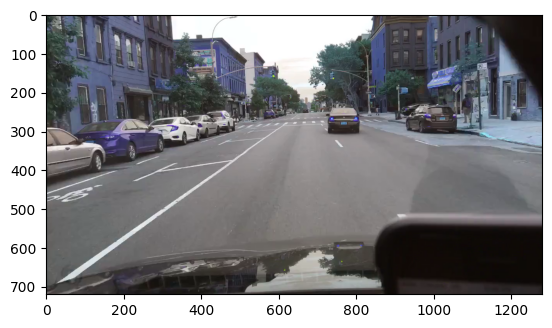

In [30]:
plt.imshow(img)  #opencv loads color in BGR format, matplot lib expects RGB format


In [31]:
## Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

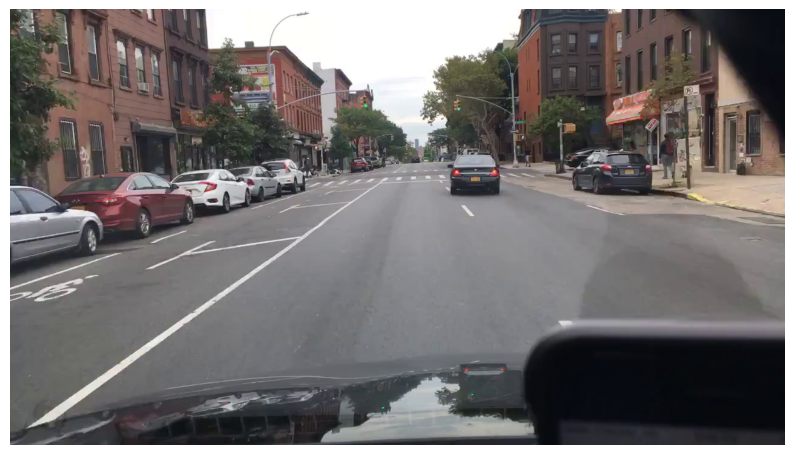

In [32]:
display_cv2_img(img)

In [33]:
cap.release()

Display Multiple Frames from the Video

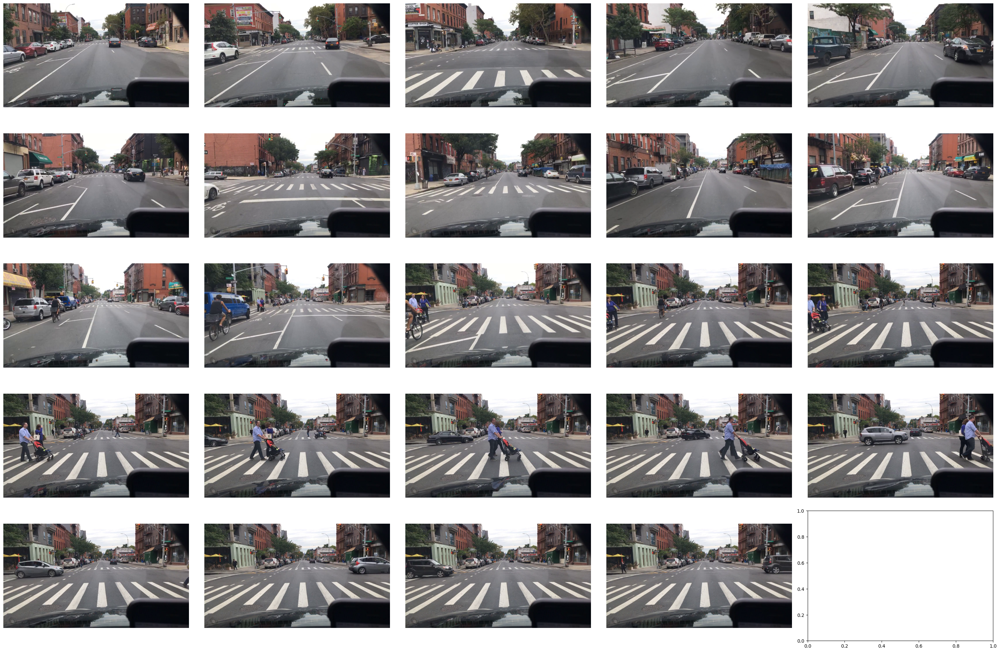

In [34]:

cap = cv2.VideoCapture('video_file.mp4')
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
frame_idx = 0
plot_idx = 0
while cap.isOpened() and plot_idx < 25:
    ret, frame = cap.read()

    if not ret:
        break

    # Select every 100th frame
    if frame_idx % 100 == 0:
        row = plot_idx // 5
        col = plot_idx % 5

        # Convert BGR to RGB
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        axs[row, col].imshow(frame_rgb)
        axs[row, col].axis('off')

        plot_idx += 1

    frame_idx += 1

cap.release()
plt.tight_layout()
plt.show()


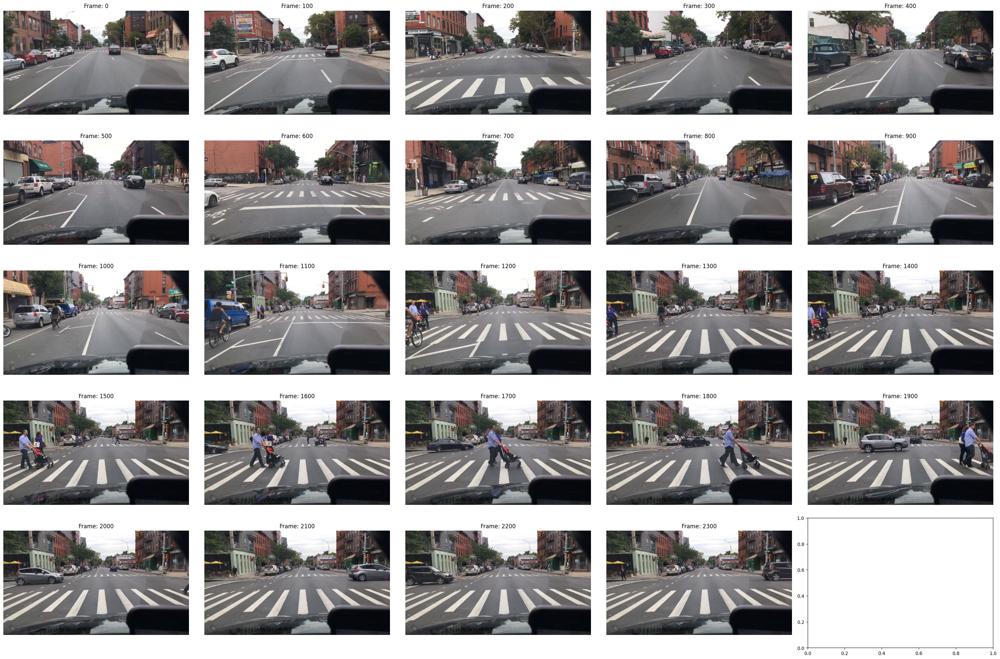

In [38]:
import cv2
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture("video_file.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:                                          #frame is divisible by 100 - Note the modulo operator
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()                                                #automatically adjusts the spacing between the plots
plt.show()
cap.release()


In [39]:
labels = pd.read_csv('mot_labels.csv',low_memory=False)
##labels.head()
#video_labels = (labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy())
#video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int") #Video is at 60Hz but the labellers did only 5 Hz

In [40]:
#print(video_labels.shape)

In [41]:
print(labels["category"].value_counts())

category
car              20456
pedestrian        3055
truck             1557
bicycle            386
rider              239
motorcycle         234
other vehicle      215
bus                119
Name: count, dtype: int64


In [42]:
cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

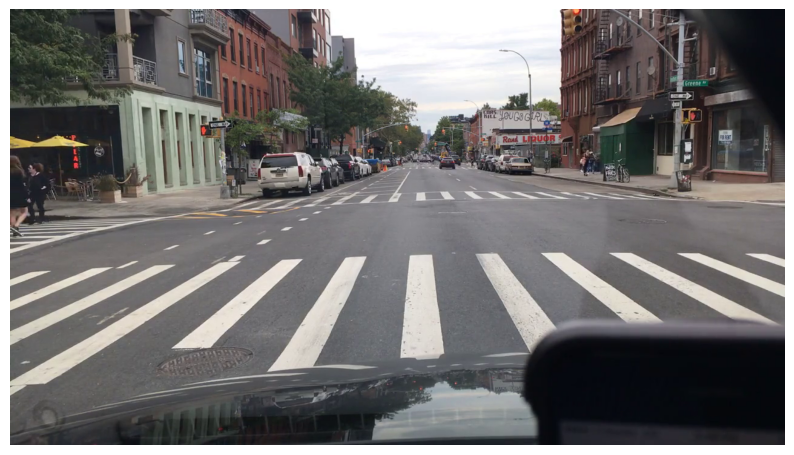

In [43]:
display_cv2_img(img)